# Libraries

In [ ]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

In [ ]:
from sklearn import datasets
from sklearn.model_selection import train_test_split

In [ ]:
import tensorflow as tf
from keras.layers import Dense, SimpleRNN
from keras.layers import InputLayer
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, GlobalMaxPooling1D, Bidirectional, GRU

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import itertools
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=0498579424e24d3626169bef3f95e26ecdf43c1d13f1572e74ad3760bd095808
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
from lime import lime_tabular

# Functions

In [ ]:
# Plotting Model Performance Metrics
def display_training_loss(training, validation):
    plt.clf()   # clear figure
    loss = training
    val_loss = validation
    epochs = range(1, len(loss) + 1)
    # "bo" is for "blue dot"
    plt.plot(epochs, loss, 'bo', label='Training loss')
    # b is for "solid blue line"
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')


    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def display_training_accuracy(training, validation):
    plt.clf()   # clear figure
    acc = training
    val_acc = validation
    epochs = range(1, len(acc) + 1)
    plt.plot(epochs, acc, 'bo', label='Training acc')
    plt.plot(epochs, val_acc, 'b', label='Validation acc')
    plt.title('Training and validation accuracy')

    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.show()

def print_validation_report(test_labels, predictions):
    print("Classification Report")
    print(classification_report(test_labels, predictions))
    print('Accuracy Score: {}'.format(accuracy_score(test_labels, predictions)))
    print('Root Mean Square Error: {}'.format(np.sqrt(MSE(test_labels, predictions))))

sns.set(font_scale=1)
def plot_confusion_matrix(y_true, y_pred):
    mtx = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(16,12))
    sns.heatmap(mtx, annot=True, fmt='d', linewidths=.75,  cbar=False, ax=ax,cmap='Blues',linecolor='white')
    #  square=True,
    plt.ylabel('true label', fontsize=20)
    plt.xlabel('predicted label', fontsize=20)

# Import data

Robots are smart… by design. To fully understand and properly navigate a task, however, they need input about their environment.

This data comes from Kaggle competition, "CareerCon 2019 - Help Navigate Robots"

We'll help robots recognize the floor surface they’re standing on using data collected from Inertial Measurement Units (IMU sensors).

Researcher’ve collected IMU sensor data while driving a small mobile robot over different floor surfaces on the university premises. The task is to predict which one of the nine floor types (carpet, tiles, concrete) the robot is on using sensor data such as acceleration and velocity. Succeed and we'll help improve the navigation of robots without assistance across many different surfaces, so they won’t fall down on the job.

The data has been collected by Heikki Huttunen and Francesco Lomio from the Department of Signal Processing and Damoon Mohamadi, Kaan Celikbilek, Pedram Ghazi and Reza Ghabcheloo from the Department of Automation and Mechanical Engineering both from Tampere University, Finland.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train = pd.read_csv('/content/drive/MyDrive/NU/MSDS458/career-con-2019/X_train.csv')
y = pd.read_csv('/content/drive/MyDrive/NU/MSDS458/career-con-2019/y_train.csv')
test = pd.read_csv('/content/drive/MyDrive/NU/MSDS458/career-con-2019/sample_submission.csv')
sub = pd.read_csv('/content/drive/MyDrive/NU/MSDS458/career-con-2019/sample_submission.csv')

# Train/Test Data split

https://kimamani89.com/2019/06/09/post-659/

In [ ]:
encode_dic = {'fine_concrete': 0,
              'concrete': 1,
              'soft_tiles': 2,
              'tiled': 3,
              'soft_pvc': 4,
              'hard_tiles_large_space': 5,
              'carpet': 6,
              'hard_tiles': 7,
              'wood': 8}
decode_dic = {0: 'fine_concrete',
              1: 'concrete',
              2: 'soft_tiles',
              3: 'tiled',
              4: 'soft_pvc',
              5: 'hard_tiles_large_space',
              6: 'carpet',
              7: 'hard_tiles',
              8: 'wood'}

In [ ]:
feature_names = list(train.columns)[3:]

In [ ]:
train.drop(['row_id', "series_id", "measurement_number"], axis=1, inplace=True)
train = train.values.reshape((3810, 128, 10))

In [ ]:
#y = y['surface'].map(encode_dic).astype(int)

In [ ]:
#y.head()

In [ ]:
#y = y['surface'].map(encode_dic).astype(int)
y.drop(["series_id", "group_id"], axis=1, inplace=True)
y = y['surface'].map(encode_dic).astype(int)
y = y.values.reshape((3810, 1))

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(train, y, test_size=0.3, random_state=42)

In [ ]:
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.3, random_state=42)

In [ ]:
y_columns = ['surface']
y_train_df = pd.DataFrame(data = y_train, columns = y_columns)
y_train_df['surface'] = y_train_df['surface'].map(decode_dic).astype(str)
y_val_df = pd.DataFrame(data = y_val, columns = y_columns)
y_val_df['surface'] = y_val_df['surface'].map(decode_dic).astype(str)
y_test_df = pd.DataFrame(data = y_test, columns = y_columns)
y_test_df['surface'] = y_test_df['surface'].map(decode_dic).astype(str)

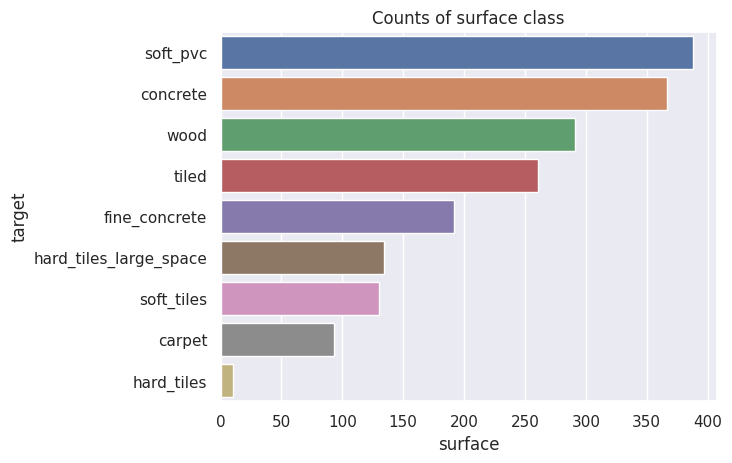

In [ ]:
df = y_train_df['surface'].value_counts().reset_index().rename(columns={'index': 'target'})
sns.barplot(x=df['surface'], y=df['target'])
plt.title('Counts of surface class')
plt.show()

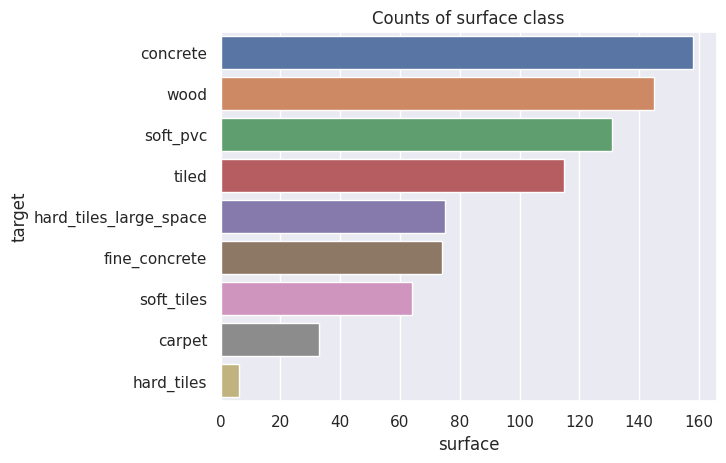

In [ ]:
df = y_val_df['surface'].value_counts().reset_index().rename(columns={'index': 'target'})
sns.barplot(x=df['surface'], y=df['target'])
plt.title('Counts of surface class')
plt.show()

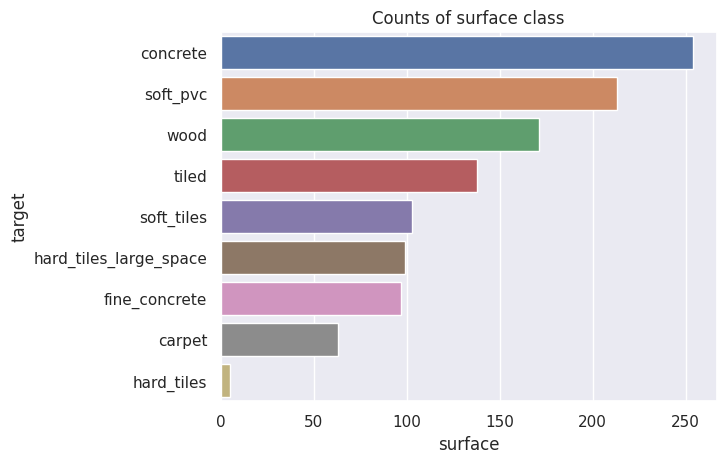

In [ ]:
df = y_test_df['surface'].value_counts().reset_index().rename(columns={'index': 'target'})
sns.barplot(x=df['surface'], y=df['target'])
plt.title('Counts of surface class')
plt.show()

# Build Model

In [ ]:
model = models.Sequential()
model.add(InputLayer(batch_input_shape=(None, 128, 10)))
model.add(LSTM(10, activation='relu'))
model.add(Dense(9, activation='softmax')) #softmax is used as the activation function for multi-class classification problems where class membership is required on more than two class labels.
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 10)                840       
                                                                 
 dense (Dense)               (None, 9)                 99        
                                                                 
Total params: 939
Trainable params: 939
Non-trainable params: 0
_________________________________________________________________


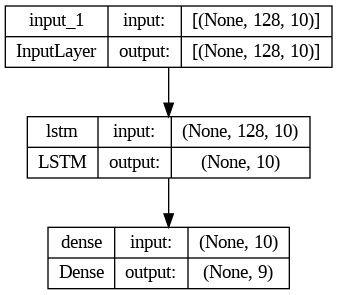

In [ ]:
keras.utils.plot_model(model, "plot.png", show_shapes=True) # plot a graph of the model

In [ ]:
%%time
model.compile(loss='SparseCategoricalCrossentropy', #Sparse Categorical Crossentropy Loss because data is not one-hot encoded
              optimizer='adam',
              metrics=['accuracy'])

history = model.fit(x_train,
          y_train,
          validation_data=(x_val, y_val),
          epochs=30)

Epoch 1/30
59/59 [==============================] - 10s 112ms/step - loss: 2.6478 - accuracy: 0.0439 - val_loss: 2.3276 - val_accuracy: 0.0424
Epoch 2/30
59/59 [==============================] - 7s 120ms/step - loss: 2.2516 - accuracy: 0.1013 - val_loss: 2.1945 - val_accuracy: 0.1685
Epoch 3/30
59/59 [==============================] - 6s 97ms/step - loss: 2.1651 - accuracy: 0.2095 - val_loss: 2.1456 - val_accuracy: 0.1635
Epoch 4/30
59/59 [==============================] - 7s 122ms/step - loss: 2.1186 - accuracy: 0.2079 - val_loss: 2.1145 - val_accuracy: 0.1635
Epoch 5/30
59/59 [==============================] - 6s 101ms/step - loss: 2.0864 - accuracy: 0.2079 - val_loss: 2.0916 - val_accuracy: 0.1635
Epoch 6/30
59/59 [==============================] - 4s 61ms/step - loss: 2.0623 - accuracy: 0.2079 - val_loss: 2.0728 - val_accuracy: 0.1660
Epoch 7/30
59/59 [==============================] - 5s 78ms/step - loss: 2.0428 - accuracy: 0.2095 - val_loss: 2.0584 - val_accuracy: 0.1660
Epoch 8/

# Testing the model

In [ ]:
test_loss, test_acc = model.evaluate(x_test, y_test)

36/36 [==============================] - 0s 11ms/step - loss: 1.5664 - accuracy: 0.4331


In [ ]:
print(f'test acc: {test_acc}, test loss: {test_loss}')

test acc: 0.4330708682537079, test loss: 1.566374659538269


# Plot the performance

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

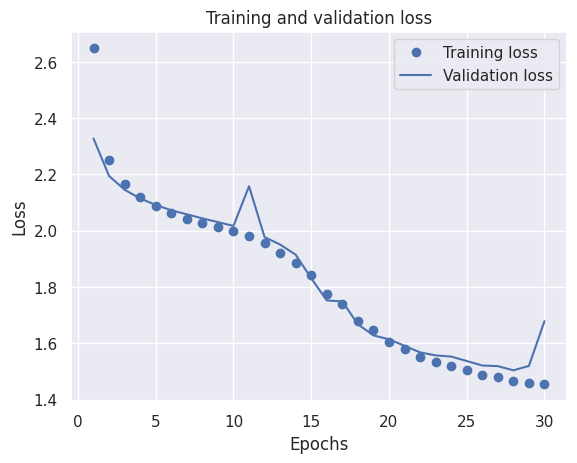

In [ ]:
display_training_loss(history.history['loss'], history.history['val_loss'])

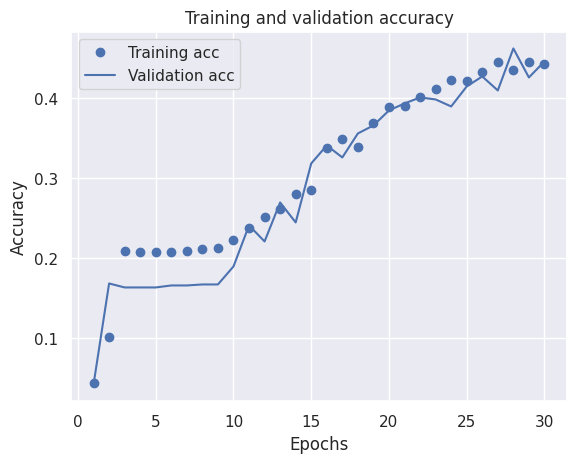

In [ ]:
display_training_accuracy(history.history['accuracy'], history.history['val_accuracy'])

# Plot the confusion matrix

In [ ]:
def plot_confusion_matrix(truth, pred, classes, normalize=False, title=''):
    cm = confusion_matrix(truth, pred)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix', size=15)
    plt.colorbar(fraction=0.046, pad=0.04)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.grid(False)
    plt.tight_layout()

In [ ]:
pred_classes = np.argmax(model.predict(x_test), axis=-1)

36/36 [==============================] - 1s 10ms/step


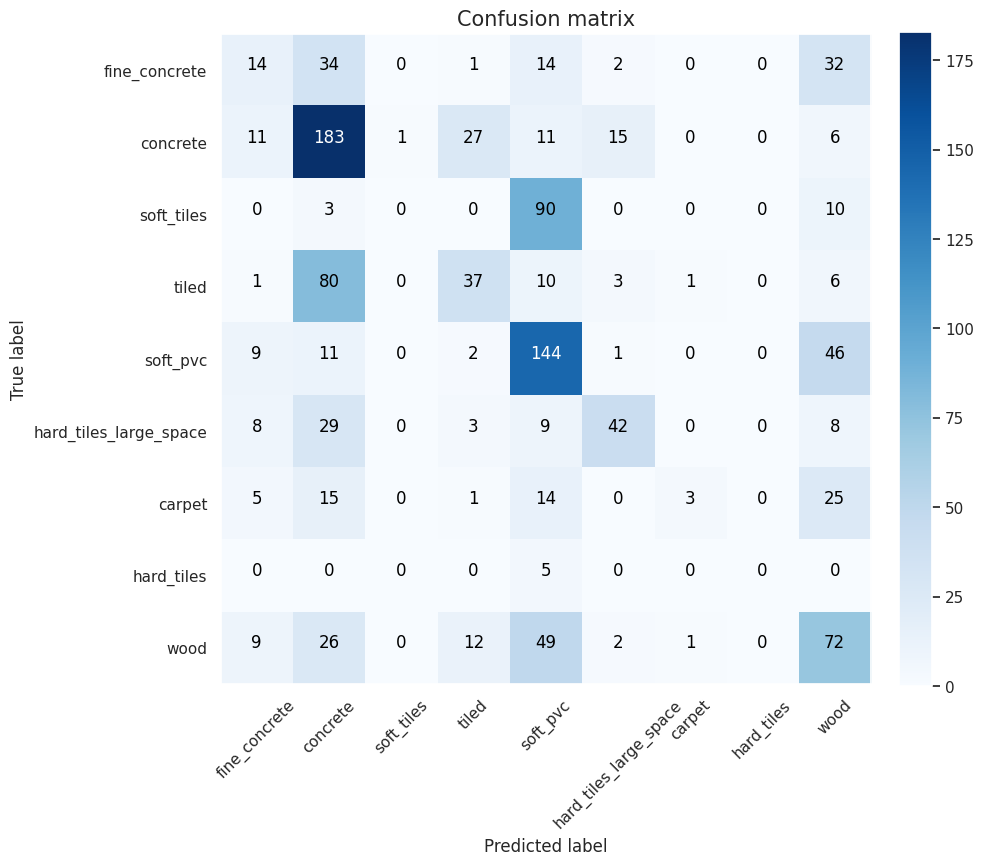

In [ ]:
plot_confusion_matrix(y_test, pred_classes, encode_dic.keys())

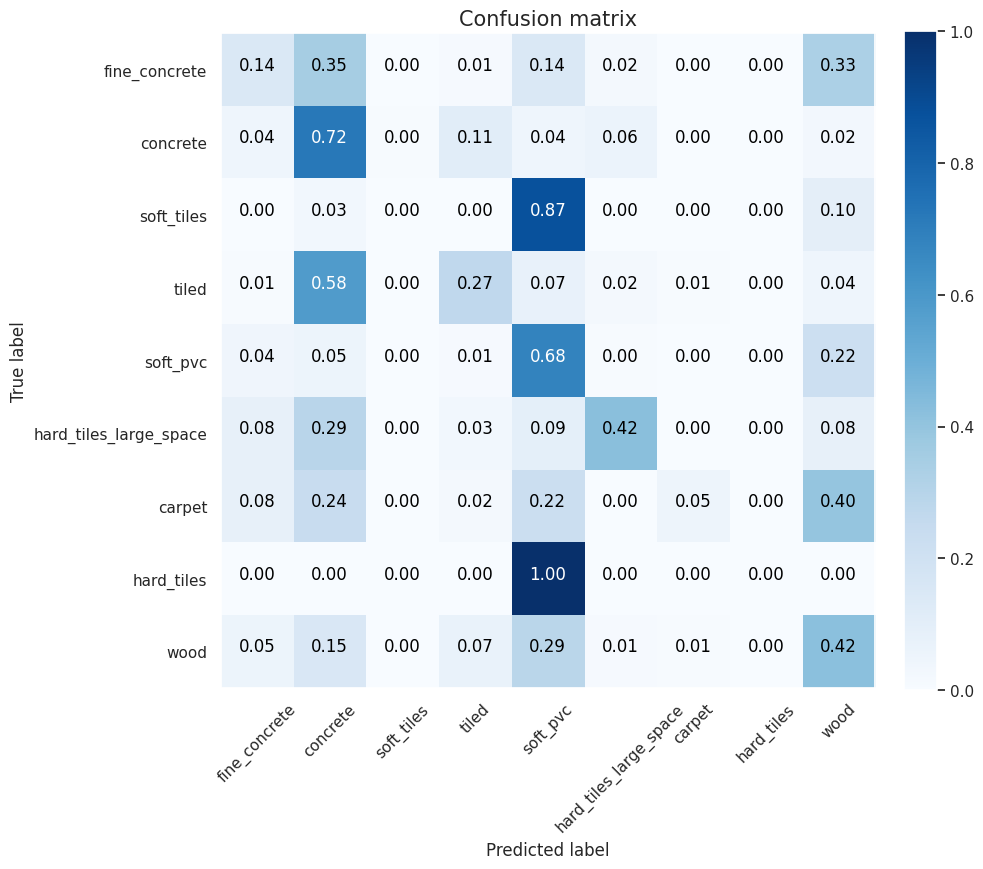

In [ ]:
plot_confusion_matrix(y_test, pred_classes, encode_dic.keys(), normalize=True)

# Activation

In [ ]:
# Extracts the outputs of the 2 layers:
layer_outputs = [layer.output for layer in model.layers]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# Get the outputs of all the hidden nodes for each of the training images
activations = activation_model.predict(x_train)
hidden_layer_activation = activations[0]

#Get the dataframe of all the node values
activation_data = {'actual_class':y_train.reshape(y_train.shape[0],)}
for k in range(0,10):
    activation_data[f"act_val_{k}"] = hidden_layer_activation[:,k]

activation_df = pd.DataFrame(activation_data)
activation_df.head(15).round(3)

59/59 [==============================] - 1s 13ms/step


,actual_class,act_val_0,act_val_1,act_val_2,act_val_3,act_val_4,act_val_5,act_val_6,act_val_7,act_val_8,act_val_9
0,1,0.001,0.717,0.00,0.128,6.711,0.177,0.059,6.052,3.117,0.443
1,2,0.000,0.000,0.00,3.600,0.000,0.000,0.007,11.528,1.597,0.000
2,1,1.104,4.591,0.01,0.032,14.835,0.075,0.264,0.208,0.101,0.021
3,1,0.000,0.343,0.00,0.076,5.589,0.442,0.117,6.758,2.933,0.429
4,2,0.000,0.000,0.00,3.130,0.000,0.000,1.939,7.315,1.044,0.000
5,1,0.000,0.000,0.00,3.390,0.000,0.268,0.044,9.840,1.147,0.000
6,0,0.000,1.296,0.00,0.108,3.561,0.987,0.263,4.830,1.191,0.428
7,1,0.000,0.001,0.00,0.001,6.726,0.244,0.030,4.876,1.926,1.384
8,5,0.000,0.000,0.01,0.006,1.326,4.600,0.053,0.428,0.000,0.549
9,3,0.000,0.029,0.00,0.079,6.677,1.262,0.185,2.250,0.380,3.283


We get the activation values of the first hidden node and combine them with the corresponding class labels into a DataFrame. We use both matplotlib and seaborn to create boxplots from the dataframe.

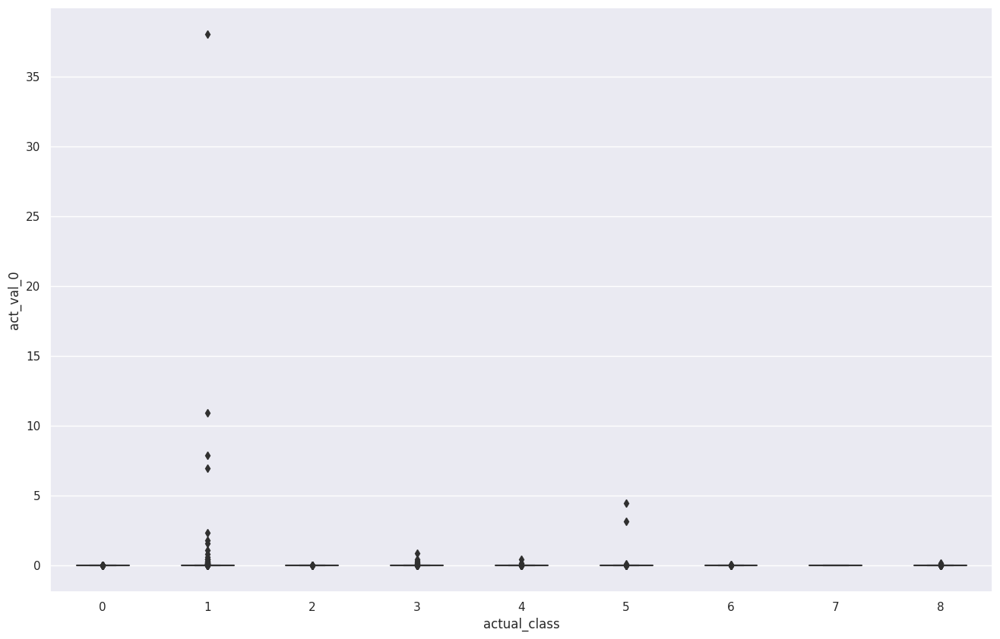

In [ ]:
# To see how closely the hidden node activation values correlate with the class labels
# Let us use seaborn for the boxplots this time.
plt.figure(figsize=(16,10))
bplot = sns.boxplot(y='act_val_0', x='actual_class',
                 data=activation_df[['act_val_0','actual_class']],
                 width=0.5,
                 palette="colorblind")

Displaying The Range Of Activation Values For Each Class Labels

In [ ]:
activation_df.groupby("actual_class")["act_val_0"].apply(lambda x: [round(min(x.tolist()),2),
 round(max(x.tolist()),2)]).reset_index().rename(columns={"act_val_0": "range_of_act_values"})

,actual_class,range_of_act_values
0,0,"[0.0, 0.02]"
1,1,"[0.0, 38.07]"
2,2,"[0.0, 0.0]"
3,3,"[0.0, 0.86]"
4,4,"[0.0, 0.42]"
5,5,"[0.0, 4.44]"
6,6,"[0.0, 0.07]"
7,7,"[0.0, 0.0]"
8,8,"[0.0, 0.15]"


N=45000
activation_df_subset = activation_df.iloc[:N].copy()
activation_df_subset.shape

In [ ]:
N=y_train.shape[0]
activation_df_subset = activation_df.iloc[:N].copy()
activation_df_subset.shape

(1866, 11)

In [ ]:
# Separating out the features
features = [*activation_data][1:] # ['act_val_0', 'act_val_1',...]

data_subset = activation_df_subset[features].values
data_subset.shape

(1866, 10)

In [ ]:
%%time
tsne = TSNE(n_components=2
            ,init='pca'
            ,learning_rate='auto'
            ,verbose=1
            ,perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(data_subset)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 1866 samples in 0.003s...
[t-SNE] Computed neighbors for 1866 samples in 0.132s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1866
[t-SNE] Computed conditional probabilities for sample 1866 / 1866
[t-SNE] Mean sigma: 0.677857
[t-SNE] KL divergence after 250 iterations with early exaggeration: 60.710716
[t-SNE] KL divergence after 300 iterations: 1.090484
CPU times: user 8.58 s, sys: 70.1 ms, total: 8.65 s
Wall time: 5.54 s


In [ ]:
tsne_results = (tsne_results - tsne_results.min()) / (tsne_results.max() - tsne_results.min())

In [ ]:
tsne_results_df = pd.DataFrame(tsne_results, columns=["tsne0", "tsne1"])
tsne_results_df["actual_class"] = activation_df_subset["actual_class"]
tsne_results_df["actual_class_label"] = tsne_results_df["actual_class"].map(decode_dic).astype(str)

In [ ]:
test=((tsne_results_df["actual_class"].unique()))
test

array([1, 2, 0, 5, 3, 4, 8, 6, 7])

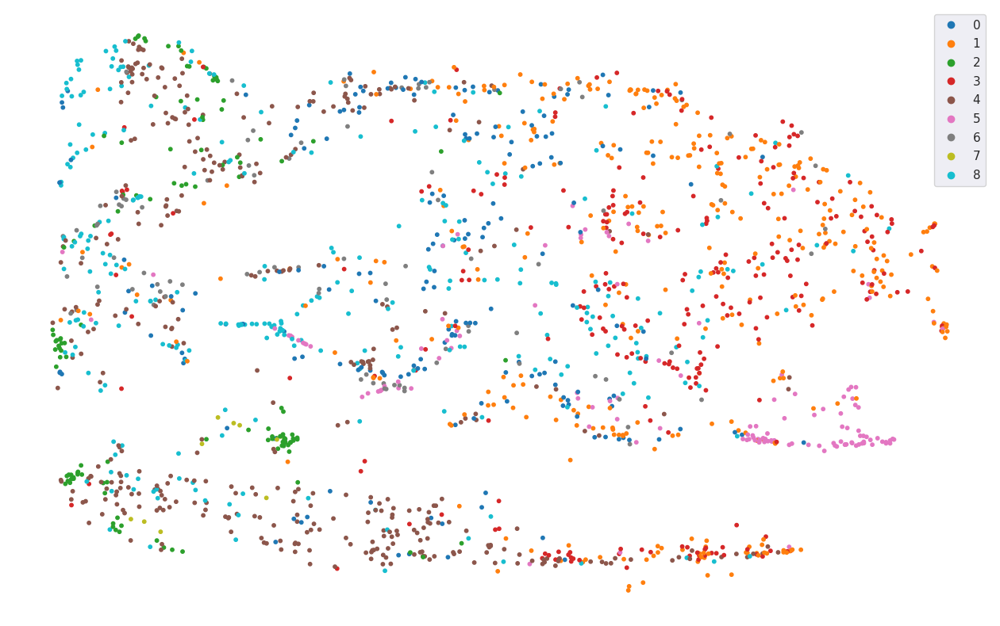

In [ ]:
cmap = plt.cm.tab10
plt.figure(figsize=(16,10))
#plt.scatter(tsne_results[:,0],tsne_results[:,1], c=y_train, s=10, cmap=cmap)
scatter1 = plt.scatter(tsne_results_df["tsne0"], tsne_results_df["tsne1"], c=tsne_results_df["actual_class"], s=10, cmap=cmap, label=tsne_results_df["actual_class_label"])

# image_positions = np.array([[1., 1.]])
# for index, position in enumerate(tsne_results):
#     dist = np.sum((position - image_positions) ** 2, axis=1)
#     if np.min(dist) > 0.02: # if far enough from other images
#         image_positions = np.r_[image_positions, [position]]
#         imagebox = mpl.offsetbox.AnnotationBbox(
#             mpl.offsetbox.OffsetImage(np.reshape(x_train[index], (32, 32, 3))),
#             position, bboxprops={"edgecolor": cmap(y_train[index]), "lw": 2})
#         plt.gca().add_artist(imagebox)
plt.legend(*scatter1.legend_elements())

plt.axis("off")

plt.show()

# Lime explanation

https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20with%20Recurrent%20Neural%20Networks.ipynb

https://lime-ml.readthedocs.io/en/latest/lime.html

In [ ]:
explainer = lime_tabular.RecurrentTabularExplainer(x_train, training_labels=y_train, feature_names=feature_names)

In [ ]:
exp = explainer.explain_instance(x_test[0], model.predict, num_features=10, labels=(6,))
exp.show_in_notebook()

157/157 [==============================] - 2s 10ms/step


In [ ]:
answer = y_test[0][0]

print(answer, ":", decode_dic[answer])

6 : carpet


In [ ]:
exp = explainer.explain_instance(x_test[1], model.predict, num_features=10, labels=(6,))
exp.show_in_notebook()

157/157 [==============================] - 2s 10ms/step


In [ ]:
answer = y_test[1][0]

print(answer, ":", decode_dic[answer])

6 : carpet


In [ ]:
exp = explainer.explain_instance(x_test[2], model.predict, num_features=10, labels=(6,))
exp.show_in_notebook()

157/157 [==============================] - 2s 10ms/step


In [ ]:
answer = y_test[2][0]

print(answer, ":", decode_dic[answer])

6 : carpet


In [ ]:
exp = explainer.explain_instance(x_test[3], model.predict, num_features=10, labels=(1,))
exp.show_in_notebook()

157/157 [==============================] - 2s 11ms/step


In [ ]:
answer = y_test[3][0]

print(answer, ":", decode_dic[answer])

1 : concrete


In [ ]:
exp = explainer.explain_instance(x_test[4], model.predict, num_features=10, labels=(4,))
exp.show_in_notebook()

157/157 [==============================] - 2s 11ms/step


In [ ]:
answer = y_test[4][0]

print(answer, ":", decode_dic[answer])

4 : soft_pvc
